# Running cellpose in colab with a GPU

(thanks to Matteo Carandini for setting this up)

UPDATED DEC 2020 for TORCH VERSION cellpose v0.6

## installation

Check CUDA version and GPU first

In [1]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243
Tue Jan 26 13:44:40 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.100      Driver Version: 440.100      CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Quadro RTX 6000     Off  | 00000000:1A:00.0 Off |                  Off |
| 33%   31C    P8    16W / 260W |  12762MiB / 24220MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  Quadro RTX 8000     Off  | 00000000:67:00.0 Off |                  Off |
|

Install cellpose -- by default the torch GPU version is installed in COLAB notebook.

In [2]:
#!pip install cellpose

import libraries and check GPU (the first time you import cellpose the models will download).

In [3]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
from cellpose import models

use_GPU = models.use_gpu()
print('>>> GPU activated? %d'%use_GPU)


** TORCH CUDA version installed and working. **
>>> GPU activated? 1


Download sample images

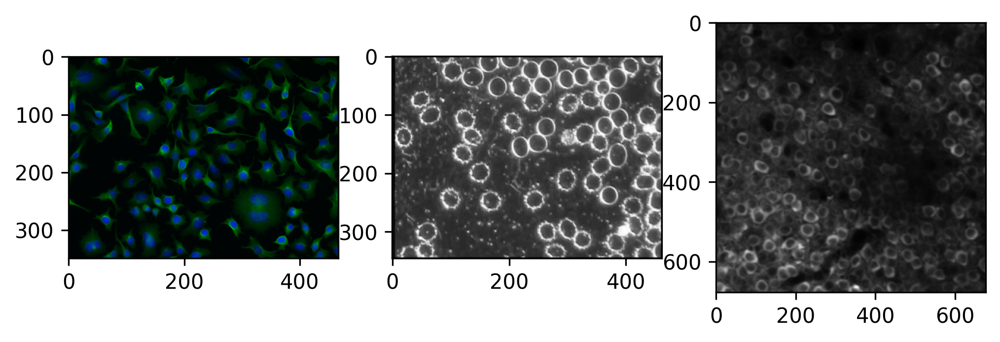

In [5]:
from cellpose import utils
# I will download images from website
urls = ['http://www.cellpose.org/static/images/img02.png',
        'http://www.cellpose.org/static/images/img03.png',
        'http://www.cellpose.org/static/images/img05.png',
        'http://www.cellpose.org/static/data/rgb_3D.tif']
files = []
for url in urls:
    parts = urlparse(url)
    filename = os.path.join("../data", os.path.basename(parts.path))
    if not os.path.exists(filename):
        sys.stderr.write('Downloading: "{}" to {}\n'.format(url, filename))
        utils.download_url_to_file(url, filename)
    files.append(filename)

# REPLACE FILES WITH YOUR IMAGE PATHS
# files = ['img0.tif', 'img1.tif']
    
imgs = [skimage.io.imread(f) for f in files]
nimg = len(imgs)

plt.figure(figsize=(8,4))
for k,img in enumerate(imgs[:-1]):
  plt.subplot(1,3,k+1)
  plt.imshow(img)


## run cellpose on 2D sample images

(exclude last image)

In [6]:
# RUN CELLPOSE

imgs_2D = imgs[:-1]

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images

masks, flows, styles, diams = model.eval(imgs_2D, diameter=None, flow_threshold=None, channels=channels)

  0%|          | 0/3 [00:00<?, ?it/s]

** TORCH CUDA version installed and working. **
>>>> using GPU
processing 3 image(s)
computing styles from images


  0%|          | 0/3 [00:00<?, ?it/s]

time spent: running network 0.24s; flow+mask computation 2.45
estimated cell diameters for 3 image(s) in 3.01 sec
>>> diameter(s) =  [29.38115358 33.17679957 30.58094729]


/home/haoxu/miniconda3/envs/cellpose_applications/lib/python3.7/site-packages/torch/nn/functional.py:3385: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "
100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

time spent: running network 1.27s; flow+mask computation 0.71
estimated masks for 3 image(s) in 2.00 sec
>>>> TOTAL TIME 5.02 sec


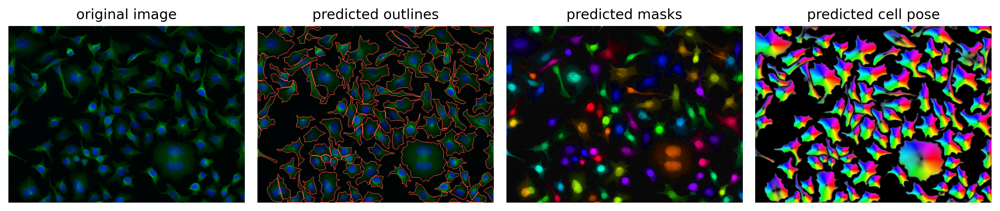

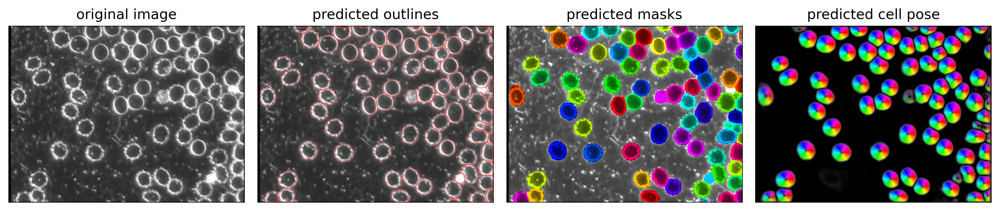

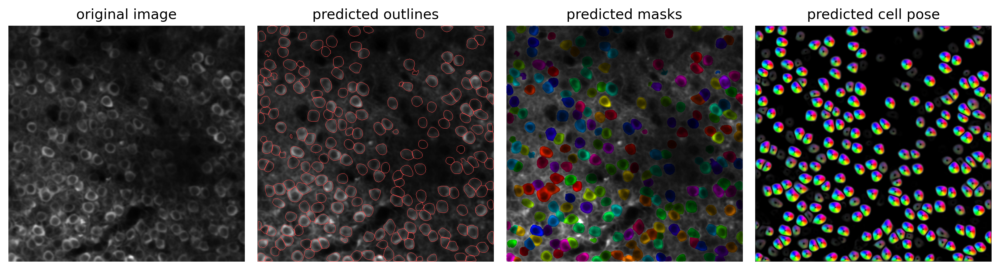

In [7]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs_2D)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx], maski, flowi, channels=channels[idx])
    plt.tight_layout()
    plt.show()

## save output to *_seg.npy

you will see the files save in the Files tab and you can download them from there

In [8]:
from cellpose import io

io.masks_flows_to_seg(imgs_2D, masks, flows, diams, files, channels)

## run cellpose 3D

In [9]:
# test 3D stack

img_3D = imgs[-1]
# with 3D you have to set the diameter manually (no auto detect)
masks, flows, styles, diams = model.eval(img_3D, channels=[2,1], diameter=25, do_3D=True)

100%|██████████| 3/3 [00:00<00:00, 21.99it/s]

processing 1 image(s)
multi-stack tiff read in as having 75 planes 2 channels

 running YX: 75 planes of size (75, 75) 





100%|██████████| 3/3 [00:00<00:00, 23.21it/s]



 running ZY: 75 planes of size (75, 75) 




100%|██████████| 3/3 [00:00<00:00, 23.85it/s]



 running ZX: 75 planes of size (75, 75) 




100%|██████████| 3/3 [00:00<00:00, 23.85it/s]


flows computed 2.14s
dynamics computed 2.39s
masks computed 2.55s
estimated masks for 1 image(s) in 2.84 sec
>>>> TOTAL TIME 2.84 sec


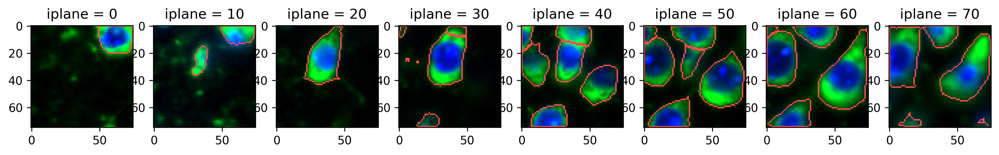

In [10]:
# DISPLAY RESULTS
plt.figure(figsize=(15,3))
for i,iplane in enumerate(np.arange(0,75,10,int)):
  img0 = plot.image_to_rgb(img_3D[iplane, [1,0]].copy(), channels=[2,3])
  plt.subplot(1,8,i+1)
  outlines = utils.masks_to_outlines(masks[iplane])
  outX, outY = np.nonzero(outlines)
  imgout= img0.copy()
  imgout[outX, outY] = np.array([255,75,75])
  plt.imshow(imgout)
  plt.title('iplane = %d'%iplane)

## run covid plate

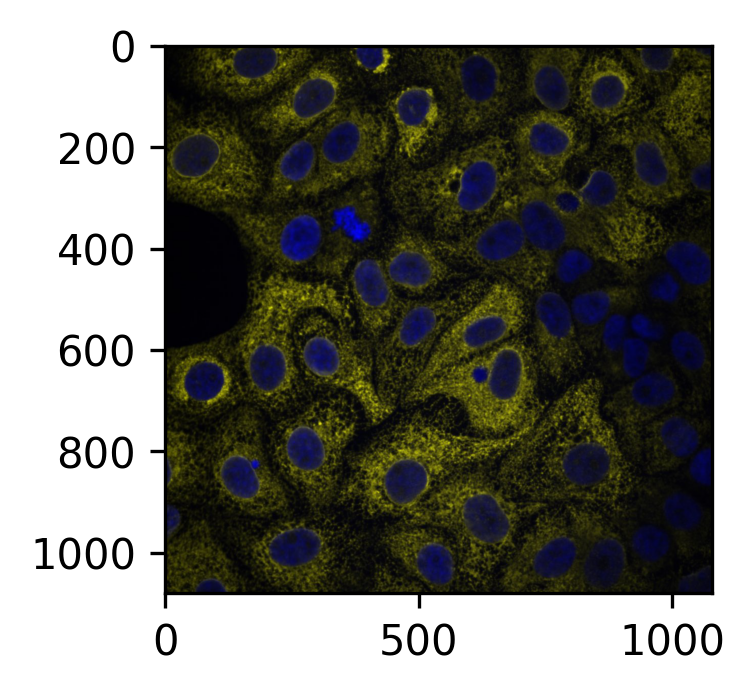

In [23]:
import imageio
# test case 1: covid screening
#imgs_paths = ['../data/20x.jpg', '../data/10x.jpg']
# test case 2: IHC image
#imgs_paths = ['../data/IHC.png']
# test case 3: covid paper data
imgs_paths = ['../data/covid_test.jpg']

imgs = [skimage.io.imread(f) for f in imgs_paths]
nimg = len(imgs)

plt.figure(figsize=(8,4))
for k,img in enumerate(imgs):
  plt.subplot(1,3,k+1)
  plt.imshow(img)

In [24]:
model = models.Cellpose(gpu=use_GPU, model_type='cyto')

** TORCH CUDA version installed and working. **
>>>> using GPU


In [42]:
# test case 1: covid screening
#channels = [[2,3], [2,3]]

#test case 2, IHC image
#channels = [[0,0]]
# test case 3: covid paper image
channels = [[3,3]]
masks, flows, styles, diams = model.eval(imgs, diameter=None, flow_threshold=None, channels=channels)

processing 1 image(s)
computing styles from images
time spent: running network 0.28s; flow+mask computation 3.04
estimated cell diameters for 1 image(s) in 3.79 sec
>>> diameter(s) =  [76.66307535]
time spent: running network 0.37s; flow+mask computation 0.20
estimated masks for 1 image(s) in 0.62 sec
>>>> TOTAL TIME 4.41 sec


<Figure size 2400x13500 with 0 Axes>

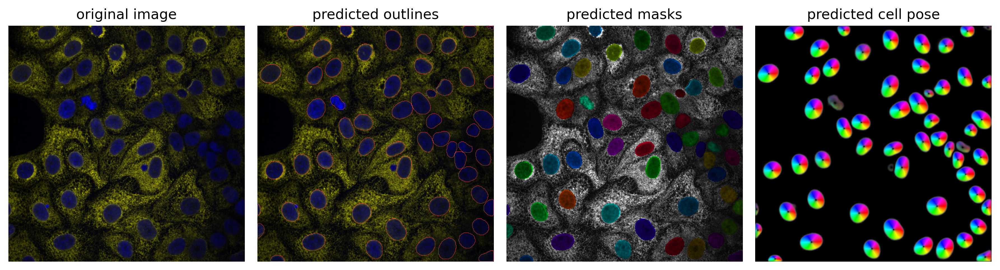

In [43]:
# DISPLAY RESULTS
from cellpose import plot

plt.figure(figsize=(8,45))
nimg = len(imgs)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx], maski, flowi, channels=channels[idx])
    plt.tight_layout()
    plt.savefig('../data/show.png', dpi=200)
    #plt.show()


In [40]:
### test IHC image

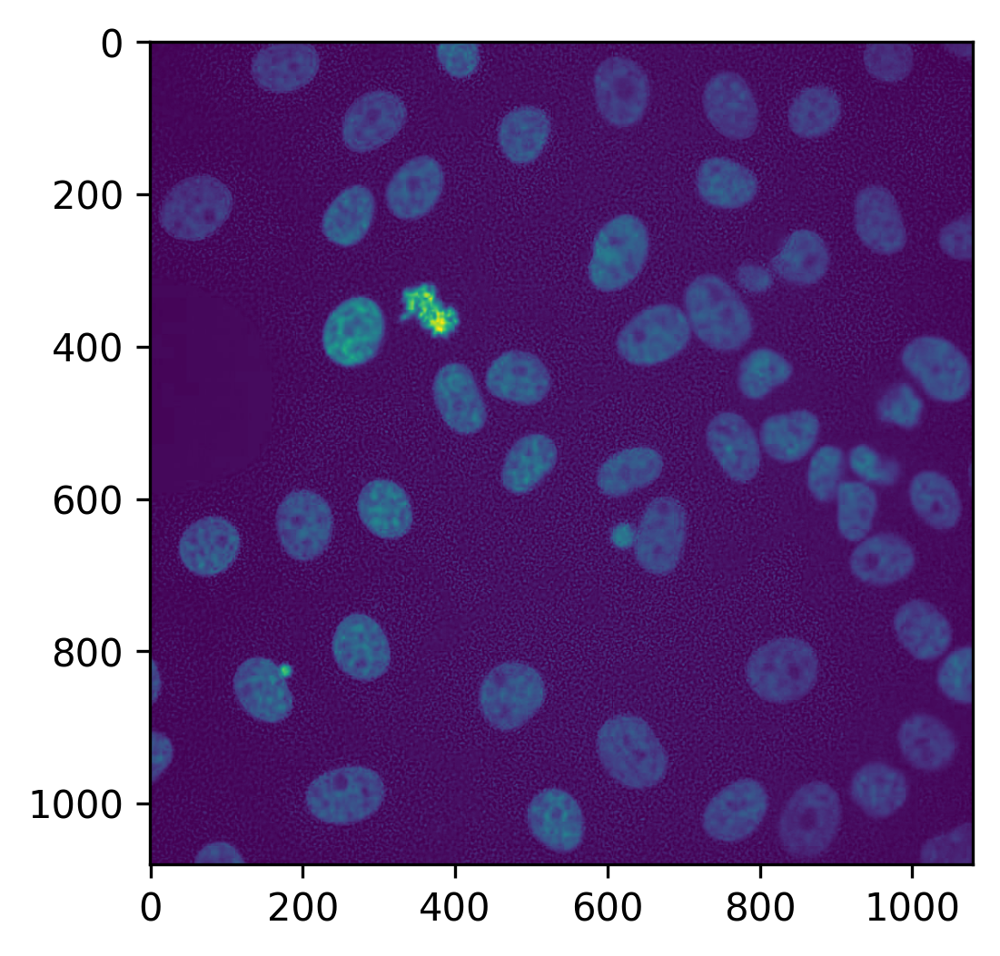

In [41]:
from matplotlib import pyplot as plt
plt.imshow(imgs[0][:,:,2])

In [ ]:
### Conclusion
#### 1. not support using er to find the cell border, but should be something clear, though not necessarily being boder mark
#### 2. good for nuclei segmentation and others